BloomTech Data Science

*Unit 2, Sprint 2, Module 3*

---

# Module Project: Hyperparameter Tuning
This week, the module projects will focus on creating and improving a model for the Tanazania Water Pump dataset. Your goal is to create a model to predict whether a water pump is functional, non-functional, or functional needs repair.

## Directions

The tasks for this project are as follows:

- **Task 1:** Use `wrangle` function to import training and test data.
- **Task 2:** Split training data into feature matrix `X` and target vector `y`.
- **Task 3:** Establish the baseline accuracy score for your dataset.
- **Task 4:** Build `clf_dt`.
- **Task 5:** Build `clf_rf`.
- **Task 6:** Evaluate classifiers using k-fold cross-validation.
- **Task 7:** Tune hyperparameters for best performing classifier.
- **Task 8:** Print out best score and params for model.
- **Task 9:** Create `submission.csv` and upload to Kaggle.

You should limit yourself to the following libraries for this project:

- `category_encoders`
- `matplotlib`
- `pandas`
- `pandas-profiling`
- `sklearn`

# I. Wrangle Data

In [22]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

from pandas_profiling import ProfileReport

from sklearn.model_selection import cross_val_score, RandomizedSearchCV, GridSearchCV
from sklearn.pipeline import make_pipeline
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.impute import SimpleImputer
from category_encoders import OrdinalEncoder

In [174]:
def wrangle(fm_path, tv_path=None):
    if tv_path:
        df = pd.merge(pd.read_csv(fm_path, 
                                  na_values=[0, -2.000000e-08],
                                 parse_dates=['date_recorded']),
                      pd.read_csv(tv_path)).set_index('id')
    else:
        df = pd.read_csv(fm_path, 
                         na_values=[0, -2.000000e-08],
                         parse_dates=['date_recorded'],
                         index_col='id')
        
    df['pump_age'] = df['date_recorded'].dt.year - df['construction_year']
        
    # Drop constant columns
    df.drop(columns=['recorded_by'], inplace=True)
    df.drop(columns=['date_recorded'], inplace=True)

    # Drop HCCCs
    cutoff = 100
    drop_cols = [col for col in df.select_dtypes('object').columns
                 if df[col].nunique() > cutoff]
    df.drop(columns=drop_cols, inplace=True)

    # Drop duplicate columns
    dupe_cols = [col for col in df.head(100).T.duplicated().index
                 if df.head(100).T.duplicated()[col]]
    df.drop(columns=dupe_cols, inplace=True)

    # Find the average gps_height, latitude, and longitude for each region and basin if missing
    group_region_code_basin = df.groupby(by=['region_code', 'basin'])
    
    df[['longitude','latitude']] = df[['longitude','latitude']].fillna(group_region_code_basin[['longitude','latitude']].transform('mean'))
    df[['longitude','latitude']] = df[['longitude','latitude']].fillna(df.groupby(by=['region_code'])[['longitude','latitude']].transform('mean'))
    
    df[['gps_height']] = df[['gps_height']].fillna(group_region_code_basin[['gps_height']].transform('mean'))
    df[['gps_height']] = df[['gps_height']].fillna(df.groupby(by=['region_code'])[['gps_height']].transform('mean'))
    df[['gps_height']] = df[['gps_height']].fillna(df.groupby(by=['basin'])[['gps_height']].transform('mean'))
        
    return df

**Task 1:** Using the above `wrangle` function to read `train_features.csv` and `train_labels.csv` into the DataFrame `df`, and `test_features.csv` into the DataFrame `X_test`.

In [175]:
df = wrangle('train_features.csv', 'train_labels.csv')
X_test = wrangle('test_features.csv')

In [176]:
df[df['gps_height'].isnull()]

,amount_tsh,gps_height,longitude,latitude,num_private,basin,region,region_code,district_code,population,...,water_quality,quality_group,quantity,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group,pump_age
id,,,,,,,,,,,,,,,,,,,,,


In [141]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [129]:
df[df['region'] == 'Shinyanga']

,amount_tsh,gps_height,longitude,latitude,num_private,basin,region,region_code,district_code,population,...,water_quality,quality_group,quantity,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group,pump_age
id,,,,,,,,,,,,,,,,,,,,,
558.0,NaN,1351.852941,33.731347,-3.284633,NaN,Internal,Shinyanga,17,2.0,NaN,...,soft,good,seasonal,shallow well,shallow well,groundwater,hand pump,hand pump,functional,NaN
61616.0,NaN,1351.852941,33.519376,-3.225549,NaN,Lake Victoria,Shinyanga,17,2.0,NaN,...,soft,good,enough,shallow well,shallow well,groundwater,other,other,non functional,NaN
18191.0,NaN,1351.852941,33.527344,-3.248380,NaN,Lake Victoria,Shinyanga,17,1.0,NaN,...,soft,good,insufficient,shallow well,shallow well,groundwater,hand pump,hand pump,functional needs repair,NaN
59340.0,NaN,1351.852941,33.527344,-3.248380,NaN,Lake Victoria,Shinyanga,17,1.0,NaN,...,soft,good,enough,shallow well,shallow well,groundwater,hand pump,hand pump,functional,NaN
15222.0,NaN,1351.852941,33.143039,-3.883174,NaN,Internal,Shinyanga,17,3.0,NaN,...,soft,good,enough,dam,dam,surface,communal standpipe multiple,communal standpipe,non functional,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34167.0,NaN,1351.852941,32.370214,-3.858296,NaN,Lake Tanganyika,Shinyanga,17,3.0,NaN,...,milky,milky,enough,shallow well,shallow well,groundwater,hand pump,hand pump,functional,NaN
72386.0,NaN,1351.852941,31.941327,-3.500428,NaN,Lake Tanganyika,Shinyanga,17,5.0,NaN,...,soft,good,enough,shallow well,shallow well,groundwater,hand pump,hand pump,functional,NaN
64136.0,NaN,1351.852941,33.615530,-2.851423,NaN,Lake Victoria,Shinyanga,17,2.0,NaN,...,soft,good,enough,shallow well,shallow well,groundwater,hand pump,hand pump,functional,NaN


In [177]:
df.groupby(by=['region_code', 'basin'])[['population']].mean()

population
region_code basin                               
1           Internal                         NaN
            Rufiji                           NaN
            Wami / Ruvu                      NaN
2           Internal                  277.814159
            Lake Victoria             198.250000
            Pangani                   227.634449
3           Internal                    3.643939
            Pangani                   112.187762
4           Pangani                   228.627611
            Wami / Ruvu               631.079365
5           Rufiji                    284.694500
            Wami / Ruvu               252.845977
6           Rufiji                    667.833333
            Wami / Ruvu               199.254545
7           Wami / Ruvu               242.443425
8           Ruvuma / Southern Coast   337.211618
9           Ruvuma / Southern Coast   248.478964
10          Lake Nyasa                229.018813
            Rufiji                    317.483254
            Ruvuma / Southern Coast   219.271106
11          Lake Nyasa                 88.837379
            Lake Victoria                    NaN
            Rufiji                    129.489516
12          Lake Nyasa                       NaN
            Lake Rukwa                       NaN
            Rufiji                           NaN
13          Internal                  251.484177
            Lake Rukwa               2500.000000
            Lake Tanganyika          1975.000000
            Rufiji                    712.520548
14          Internal                         NaN
            Lake Rukwa                       NaN
            Lake Tanganyika                  NaN
            Rufiji                           NaN
15          Lake Rukwa                407.468514
            Lake Tanganyika           341.096463
16          Lake Tanganyika           502.556650
17          Internal                         NaN
            Lake Tanganyika                  NaN
            Lake Victoria             434.264706
18          Lake Tanganyika                  NaN
            Lake Victoria                    NaN
            Ruvuma / Southern Coast   164.857143
19          Lake Tanganyika                  NaN
            Lake Victoria             567.893333
20          Lake Victoria             524.738994
21          Internal                  332.281734
            Pangani                   211.316017
            Wami / Ruvu               551.303030
24          Internal                  418.461832
40          Wami / Ruvu                60.000000
60          Rufiji                    184.762548
            Wami / Ruvu               973.387500
80          Rufiji                    306.187500
            Ruvuma / Southern Coast   370.578891
90          Ruvuma / Southern Coast   171.562327
99          Ruvuma / Southern Coast   497.962099

# II. Split Data

**Task 2:** Split your DataFrame `df` into a feature matrix `X` and the target vector `y`. You want to predict `'status_group'`.

**Note:** You won't need to do a train-test split because you'll use cross-validation instead.

In [178]:
target = 'status_group'
X = df.drop(target, axis=1)
y = df[target]

# III. Establish Baseline

**Task 3:** Since this is a **classification** problem, you should establish a baseline accuracy score. Figure out what is the majority class in `y_train` and what percentage of your training observations it represents.

In [179]:
baseline_acc = y.value_counts(normalize=True).max()
baseline_class = y.value_counts().idxmax()
print('Baseline Accuracy Score:', baseline_acc, baseline_class)

Baseline Accuracy Score: 0.5429828068772491 functional


# IV. Build Models

**Task 4:** Build a `Pipeline` named `clf_dt`. Your `Pipeline` should include:

- an `OrdinalEncoder` transformer for categorical features.
- a `SimpleImputer` transformer fot missing values.
- a `DecisionTreeClassifier` Predictor.

**Note:** Do not train `clf_dt`. You'll do that in a subsequent task. 

In [51]:
clf_dt = make_pipeline(OrdinalEncoder(),
                      SimpleImputer(strategy='mean'),
                      DecisionTreeClassifier(random_state=11,
                                            max_depth=10))

**Task 5:** Build a `Pipeline` named `clf_rf`. Your `Pipeline` should include:

- an `OrdinalEncoder` transformer for categorical features.
- a `SimpleImputer` transformer fot missing values.
- a `RandomForestClassifier` predictor.

**Note:** Do not train `clf_rf`. You'll do that in a subsequent task. 

In [180]:
clf_rf = make_pipeline(OrdinalEncoder(),
                      SimpleImputer(strategy='mean'),
                      RandomForestClassifier(random_state=11,
                                            n_jobs=-1,
                                            n_estimators=240,
                                            max_depth=25))

# V. Check Metrics

**Task 6:** Evaluate the performance of both of your classifiers using k-fold cross-validation.

In [146]:
# cv_scores_dt = cross_val_score(clf_dt, X, y, cv=5, n_jobs=-1)
cv_scores_rf = cross_val_score(clf_rf, X, y, cv=5, n_jobs=-1)

In [9]:
print('CV scores DecisionTreeClassifier')
print(cv_scores_dt)
print('Mean CV accuracy score:', cv_scores_dt.mean())
print('STD CV accuracy score:', cv_scores_dt.std())

CV scores DecisionTreeClassifier
[0.74326599 0.73579545 0.74579125 0.74789562 0.74123961]
Mean CV accuracy score: 0.7427975850085973
STD CV accuracy score: 0.0041624157207019955


In [147]:
print('CV score RandomForestClassifier')
print(cv_scores_rf)
print('Mean CV accuracy score:', cv_scores_rf.mean())
print('STD CV accuracy score:', cv_scores_rf.std())

CV score RandomForestClassifier
[0.79976852 0.80345118 0.79945286 0.80829125 0.80037883]
Mean CV accuracy score: 0.8022685264904826
STD CV accuracy score: 0.0033292876552516396


# VI. Tune Model

**Task 7:** Choose the best performing of your two models and tune its hyperparameters using a `RandomizedSearchCV` named `model`. Make sure that you include cross-validation and that `n_iter` is set to at least `25`.

**Note:** If you're not sure which hyperparameters to tune, check the notes from today's guided project and the `sklearn` documentation. 

In [196]:
clf_rf = make_pipeline(OrdinalEncoder(),
                      SimpleImputer(strategy='median'),
                      RandomForestClassifier(random_state=11,
                                            n_jobs=-1,
                                            n_estimators=220,
                                            max_depth=34,
                                            min_samples_leaf=2,
                                            criterion='gini'
                                            ))
clf_rf.fit(X, y)

cv_scores_rf = cross_val_score(clf_rf, X, y, cv=5, n_jobs=-1)
print('CV score RandomForestClassifier')
print(cv_scores_rf)
print('Mean CV accuracy score:', cv_scores_rf.mean())
print('STD CV accuracy score:', cv_scores_rf.std())

CV score RandomForestClassifier
[0.80566077 0.80555556 0.80450337 0.81218434 0.8034305 ]
Mean CV accuracy score: 0.8062669072073998
STD CV accuracy score: 0.003067401972697375


In [207]:
param_grid = {
#     'simpleimputer__strategy': ['mean', 'median'],
#     'randomforestclassifier__max_depth': range(28, 40, 2),
#     'randomforestclassifier__n_estimators': range(200, 320, 20)
    'randomforestclassifier__random_state': range(1,300,1),
}

In [208]:
model = RandomizedSearchCV(clf_rf,
                           param_distributions=param_grid,
                           n_jobs=-1,
                           verbose=1,
                           n_iter=25,
                           cv=5)
model.fit(X, y)

Fitting 5 folds for each of 25 candidates, totalling 125 fits


RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('ordinalencoder',
                                              OrdinalEncoder(cols=['basin',
                                                                   'region',
                                                                   'public_meeting',
                                                                   'scheme_management',
                                                                   'permit',
                                                                   'extraction_type',
                                                                   'extraction_type_group',
                                                                   'extraction_type_class',
                                                                   'management',
                                                                   'management_group',
                                                                   'payment',
                                                                   'payment_type',
                                                                   'water_quality',
                                                                   'quality_group',
                                                                   'quantity',
                                                                   'source',
                                                                   'source_type',
                                                                   'source_c...
hand pump             2
other                 3
improved spring       4
cattle trough         5
dam                   6
NaN                  -2
dtype: int64}])),
                                             ('simpleimputer',
                                              SimpleImputer(strategy='median')),
                                             ('randomforestclassifier',
                                              RandomForestClassifier(max_depth=34,
                                                                     min_samples_leaf=2,
                                                                     n_estimators=220,
                                                                     n_jobs=-1,
                                                                     random_state=11))]),
                   n_iter=25, n_jobs=-1,
                   param_distributions={'randomforestclassifier__random_state': range(1, 300)},
                   verbose=1)

In [201]:
model = GridSearchCV(clf_rf,
                    param_grid=param_grid,n_jobs=-1,
                    verbose=1,
                    cv=5)
model.fit(X, y)

Fitting 5 folds for each of 6 candidates, totalling 30 fits


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('ordinalencoder',
                                        OrdinalEncoder(cols=['basin', 'region',
                                                             'public_meeting',
                                                             'scheme_management',
                                                             'permit',
                                                             'extraction_type',
                                                             'extraction_type_group',
                                                             'extraction_type_class',
                                                             'management',
                                                             'management_group',
                                                             'payment',
                                                             'payment_type',
                                                             'water_quality',
                                                             'quality_group',
                                                             'quantity',
                                                             'source',
                                                             'source_type',
                                                             'source_class',...
                                                                 'mapping': communal standpipe    1
hand pump             2
other                 3
improved spring       4
cattle trough         5
dam                   6
NaN                  -2
dtype: int64}])),
                                       ('simpleimputer',
                                        SimpleImputer(strategy='median')),
                                       ('randomforestclassifier',
                                        RandomForestClassifier(max_depth=34,
                                                               min_samples_leaf=2,
                                                               n_estimators=220,
                                                               n_jobs=-1,
                                                               random_state=11))]),
             n_jobs=-1,
             param_grid={'randomforestclassifier__random_state': [11, 15, 16,
                                                                  17, 18, 19]},
             verbose=1)

In [209]:
best_score = model.best_score_
best_params = model.best_params_

print('Best score for `model`:', best_score)
print('Best params for `model`:', best_params)

Best score for `model`: 0.8072559710897605
Best params for `model`: {'randomforestclassifier__random_state': 141}


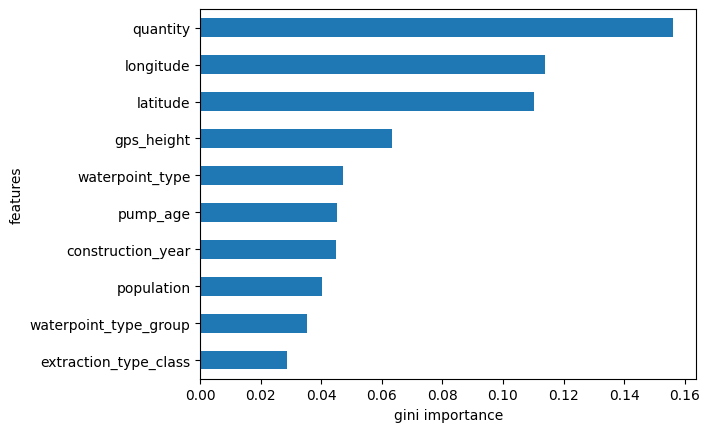

In [210]:
features = clf_rf.named_steps['ordinalencoder'].get_feature_names()
gini_importances =  clf_rf.named_steps['randomforestclassifier'].feature_importances_
pd.Series(data=gini_importances, index=features).sort_values().tail(10).plot(kind='barh')
plt.ylabel('features')
plt.xlabel('gini importance')
plt.show()

**Task 8:** Print out the best score and best params for `model`.

## Grid search

CV score RandomForestClassifier
[0.80755471 0.80702862 0.80460859 0.81207912 0.8023782 ]
Mean CV accuracy score: 0.8067298480260175
STD CV accuracy score: 0.003250263159157976


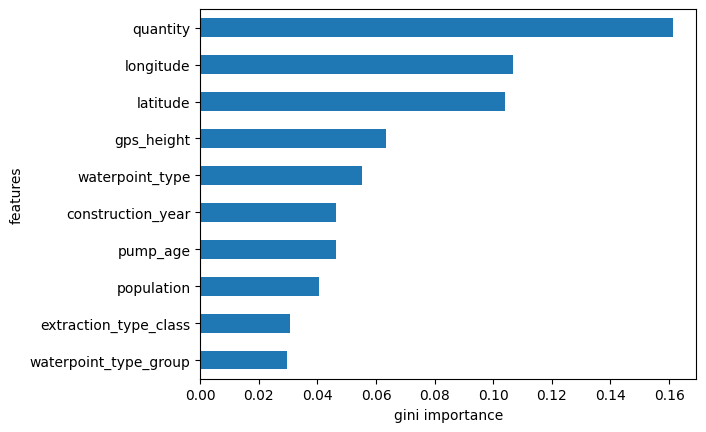

Fitting 5 folds for each of 4 candidates, totalling 20 fits


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('ordinalencoder',
                                        OrdinalEncoder(cols=['basin', 'region',
                                                             'public_meeting',
                                                             'scheme_management',
                                                             'permit',
                                                             'extraction_type',
                                                             'extraction_type_group',
                                                             'extraction_type_class',
                                                             'management',
                                                             'management_group',
                                                             'payment',
                                                             'payment_type',
                                                             'water_quality',
                                                             'quality_group',
                                                             'quantity',
                                                             'source',
                                                             'source_type',
                                                             'source_class',...
                                                                 'data_type': dtype('O'),
                                                                 'mapping': communal standpipe    1
hand pump             2
other                 3
improved spring       4
cattle trough         5
dam                   6
NaN                  -2
dtype: int64}])),
                                       ('simpleimputer', SimpleImputer()),
                                       ('randomforestclassifier',
                                        RandomForestClassifier(max_depth=24,
                                                               min_samples_leaf=2,
                                                               n_estimators=260,
                                                               n_jobs=-1,
                                                               random_state=11))]),
             n_jobs=-1,
             param_grid={'randomforestclassifier__random_state': [10, 100, 150,
                                                                  200]},
             verbose=1)

In [61]:
best_score = model.best_score_
best_params = model.best_params_

print('Best score for `model`:', best_score)
print('Best params for `model`:', best_params)

Best score for `model`: 0.8063300163761861
Best params for `model`: {'randomforestclassifier__random_state': 10}


# Communicate Results

**Task 9:** Create a DataFrame `submission` whose index is the same as `X_test` and that has one column `'status_group'` with your predictions. Next, save this DataFrame as a CSV file and upload your submissions to our competition site. 

**Note:** Check the `sample_submission.csv` file on the competition website to make sure your submissions follows the same formatting. 

In [211]:
submission = pd.DataFrame({'status_group': model.predict(X_test)}, index=X_test.index)

In [212]:
submission

,status_group
id,
37098,non functional
14530,functional
62607,functional
46053,non functional
47083,functional
...,...
26092,functional
919,non functional
47444,non functional


In [213]:
submission.to_csv('submission_filledvalues141.csv')